## test DataPreapare

In [3]:
import keras 
import tensorflow as tf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import autokeras as ak
import tensorflow_addons as tfa

c:\anaconda3\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
c:\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and 

In [19]:
import csv
k = 0
with open("C:/Users/Александр/Downloads/open-meteo-52.55N13.41E38m.csv", 'r') as f:
    csv_reader = csv.reader(f)
    csv_reader = list(csv_reader)[3:]
# df = pd.read_csv("C:/Users/Александр/Downloads/open-meteo-52.55N13.41E38m.csv", sep=',')

# batch_size = 64
# validation_split = 0.15
# test_split = 0.15

In [26]:
df = pd.DataFrame(csv_reader[1:], columns=csv_reader[0])

In [28]:
df = df.drop('time', axis=1)
df.head()

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),weather_code (wmo code),pressure_msl (hPa),...,wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³)
0,-5.7,85,-7.8,-11.8,NaN,NaN,NaN,NaN,3,1012.9,...,321,NaN,-4.0,-2.2,1.2,7.0,0.376,0.377,0.382,0.365
1,-5.4,86,-7.4,-11.4,NaN,NaN,NaN,NaN,3,1014.0,...,322,NaN,-3.7,-2.3,1.2,7.0,0.376,0.377,0.382,0.365
2,-5.5,87,-7.4,-11.5,NaN,NaN,NaN,NaN,3,1015.1,...,323,NaN,-3.7,-2.3,1.2,7.0,0.376,0.377,0.382,0.365
3,-6.2,87,-8.0,-12.1,NaN,NaN,NaN,NaN,3,1016.1,...,321,NaN,-4.4,-2.4,1.2,7.0,0.376,0.377,0.382,0.365
4,-6.1,87,-7.8,-11.9,NaN,NaN,NaN,NaN,3,1017.5,...,321,NaN,-4.4,-2.5,1.2,7.0,0.376,0.377,0.382,0.365


In [30]:
df = df.apply(lambda z: pd.to_numeric(z, errors='coerce').astype('float16'))
df_inter = df.interpolate(method='linear', limit_direction='both')

# x_pred = df_test.apply(lambda z: pd.to_numeric(z, errors='coerce').astype('Int16'))
# x_inter_pred = x_pred.interpolate(method='linear', limit_direction='both')

# X_train, X_temp, y_train, y_temp = train_test_split(x_inter, y, test_size=validation_split, shuffle=False)
# X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=test_split, shuffle=False)

# scaler = MinMaxScaler(feature_range=(0, 1))
# scaler.fit(X_train)

# x_pred_scaler = scaler.transform(x_inter_pred)

# X_train_scaled = scaler.transform(X_train)
# X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test)

In [ ]:
y = df['y']
y.info(verbose=True)

label_encoder = LabelEncoder()

vec = label_encoder.fit_transform(y)

y = keras.utils.to_categorical(vec, num_classes = 2, dtype ="int32")

## DataPreapare

In [153]:
import os
import pandas as pd
all_data = []

for i in os.listdir(r'data/slices_irkutsk_21'):
    import csv
    k = 0
    with open("data/slices_irkutsk_21/"+i, 'r') as f:
        csv_reader = csv.reader(f)
        csv_reader = list(csv_reader)[3:]
    df_con = pd.DataFrame(csv_reader[1:], columns=csv_reader[0])
    all_data.append(df_con) 

df = pd.concat(all_data).reset_index(drop=True)
df = df.replace([None, 'NaN'], pd.NA)

In [154]:
df

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),showers (mm),snowfall (cm),snow_depth (m),...,temperature_180m (°C),soil_temperature_0cm (°C),soil_temperature_6cm (°C),soil_temperature_18cm (°C),soil_temperature_54cm (°C),soil_moisture_0_to_1cm (m³/m³),soil_moisture_1_to_3cm (m³/m³),soil_moisture_3_to_9cm (m³/m³),soil_moisture_9_to_27cm (m³/m³),soil_moisture_27_to_81cm (m³/m³)
0,2024-01-01T00:00,-12.0,99,-12.1,-15.9,0.00,0.00,0.00,0.00,0.19,...,-5.0,-4.7,-4.6,-4.1,-2.7,0.314,0.314,0.314,0.314,0.316
1,2024-01-01T01:00,-12.2,100,-12.2,-16.1,0.00,0.00,0.00,0.00,0.19,...,-4.9,-4.7,-4.7,-4.1,-2.7,0.314,0.314,0.314,0.314,0.316
2,2024-01-01T02:00,-12.5,100,-12.5,-16.3,0.00,0.00,0.00,0.00,0.19,...,-4.8,-4.7,-4.7,-4.1,-2.7,0.314,0.314,0.314,0.314,0.316
3,2024-01-01T03:00,-12.2,99,-12.3,-15.9,0.00,0.00,0.00,0.00,0.19,...,-4.6,-4.6,-4.7,-4.1,-2.7,0.314,0.314,0.314,0.314,0.316
4,2024-01-01T04:00,-10.9,93,-11.8,-14.6,0.00,0.00,0.00,0.00,0.19,...,-4.2,-4.5,-4.7,-4.1,-2.7,0.314,0.314,0.314,0.314,0.316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80563,2024-01-01T19:00,-10.6,93,-11.5,-14.4,0.00,0.00,0.00,0.00,0.21,...,-3.0,-4.5,-4.6,-4.0,-2.6,0.314,0.314,0.314,0.314,0.316
80564,2024-01-01T20:00,-11.0,95,-11.6,-14.7,0.00,0.00,0.00,0.00,0.21,...,-3.3,-4.6,-4.6,-3.9,-2.6,0.314,0.314,0.314,0.314,0.316
80565,2024-01-01T21:00,-11.5,99,-11.6,-15.1,0.00,0.00,0.00,0.00,0.21,...,-3.4,-4.6,-4.6,-3.9,-2.6,0.314,0.314,0.314,0.314,0.316
80566,2024-01-01T22:00,-11.4,99,-11.5,-15.2,0.00,0.00,0.00,0.00,0.21,...,-3.4,-4.7,-4.7,-4.0,-2.6,0.314,0.314,0.314,0.314,0.316


In [155]:
df = df.sort_values('time')
df.drop_duplicates(inplace=True)
df = df.reset_index(drop=True)

In [156]:
df = df.iloc[df['temperature_2m (°C)'].first_valid_index():].reset_index(drop=True)

In [157]:
for col in df.columns:
    # Пропускаем столбцы, которые не нужно преобразовывать
    if col in ['time']:
        continue
    df[col] = pd.to_numeric(df[col], errors='coerce').astype('float16') 

In [158]:
df

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),showers (mm),snowfall (cm),snow_depth (m),...,temperature_180m (°C),soil_temperature_0cm (°C),soil_temperature_6cm (°C),soil_temperature_18cm (°C),soil_temperature_54cm (°C),soil_moisture_0_to_1cm (m³/m³),soil_moisture_1_to_3cm (m³/m³),soil_moisture_3_to_9cm (m³/m³),soil_moisture_9_to_27cm (m³/m³),soil_moisture_27_to_81cm (m³/m³)
0,2021-03-23T00:00,-2.599609,97.0,-3.000000,-5.800781,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-03-23T01:00,-1.000000,95.0,-1.700195,-4.000000,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-03-23T02:00,0.199951,96.0,-0.399902,-2.599609,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-03-23T03:00,1.299805,94.0,0.500000,-1.000000,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-03-23T04:00,1.700195,90.0,0.300049,-0.799805,0.0,0.0,0.0,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34699,2025-03-05T19:00,-8.601562,87.0,-10.296875,-11.898438,0.0,0.0,0.0,0.0,0.199951,...,-2.099609,-3.800781,-3.400391,-5.199219,-5.699219,0.386963,0.373047,0.332031,0.302979,0.304932
34700,2025-03-05T20:00,-8.500000,81.0,-11.203125,-12.296875,0.0,0.0,0.0,0.0,0.199951,...,-3.300781,-4.000000,-3.599609,-5.199219,-5.800781,0.386963,0.373047,0.332031,0.302979,0.304932
34701,2025-03-05T21:00,-8.796875,76.0,-12.296875,-12.898438,0.0,0.0,0.0,0.0,0.199951,...,-5.699219,-4.199219,-3.800781,-5.199219,-5.699219,0.385986,0.373047,0.332031,0.302979,0.304932
34702,2025-03-05T22:00,-8.203125,72.0,-12.398438,-12.101562,0.0,0.0,0.0,0.0,0.199951,...,-6.398438,-4.500000,-4.000000,-5.101562,-5.699219,0.385986,0.373047,0.332031,0.302979,0.304932


In [159]:
df = df.interpolate(method='linear', limit_direction='both')

C:\Windows\Temp\ipykernel_23308\582422909.py:1: FutureWarning:

DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.



In [160]:
df.to_csv('data/irkutsk-concatenated-2021.csv', index=False)

# Models

In [161]:
import pandas as pd

df = pd.read_csv('data/irkutsk-concatenated-2021.csv')
df['time'] = pd.to_datetime(df['time'])

In [162]:
df

,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),showers (mm),snowfall (cm),snow_depth (m),...,temperature_180m (°C),soil_temperature_0cm (°C),soil_temperature_6cm (°C),soil_temperature_18cm (°C),soil_temperature_54cm (°C),soil_moisture_0_to_1cm (m³/m³),soil_moisture_1_to_3cm (m³/m³),soil_moisture_3_to_9cm (m³/m³),soil_moisture_9_to_27cm (m³/m³),soil_moisture_27_to_81cm (m³/m³)
0,2021-03-23 00:00:00,-2.6,97.0,-3.0,-5.8,0.0,0.0,0.0,0.0,0.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
1,2021-03-23 01:00:00,-1.0,95.0,-1.7,-4.0,0.0,0.0,0.0,0.0,0.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
2,2021-03-23 02:00:00,0.2,96.0,-0.4,-2.6,0.0,0.0,0.0,0.0,0.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
3,2021-03-23 03:00:00,1.3,94.0,0.5,-1.0,0.0,0.0,0.0,0.0,0.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
4,2021-03-23 04:00:00,1.7,90.0,0.3,-0.8,0.0,0.0,0.0,0.0,0.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34699,2025-03-05 19:00:00,-8.6,87.0,-10.3,-11.9,0.0,0.0,0.0,0.0,0.2,...,-2.1,-3.8,-3.4,-5.2,-5.7,0.387,0.373,0.332,0.303,0.305
34700,2025-03-05 20:00:00,-8.5,81.0,-11.2,-12.3,0.0,0.0,0.0,0.0,0.2,...,-3.3,-4.0,-3.6,-5.2,-5.8,0.387,0.373,0.332,0.303,0.305
34701,2025-03-05 21:00:00,-8.8,76.0,-12.3,-12.9,0.0,0.0,0.0,0.0,0.2,...,-5.7,-4.2,-3.8,-5.2,-5.7,0.386,0.373,0.332,0.303,0.305
34702,2025-03-05 22:00:00,-8.2,72.0,-12.4,-12.1,0.0,0.0,0.0,0.0,0.2,...,-6.4,-4.5,-4.0,-5.1,-5.7,0.386,0.373,0.332,0.303,0.305


## visualize

In [91]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as py

# 1. Ensure 'time' is a datetime object
df['time'] = pd.to_datetime(df['time'])

# Create initial figure with daily grouping
df['group'] = df['time']
df_grouped = df.groupby('group')['temperature_2m (°C)'].mean().reset_index()


fig = px.line(df_grouped, 
                x='group', 
                y='temperature_2m (°C)',
                line_shape='spline',
                title="<b>График температуры на высоте 2х метров</b>")

fig.update_traces(line=dict(width=2, smoothing=0.8))
fig.update_xaxes(range=[df['time'][0] - pd.Timedelta(weeks=2), df['time'].iloc[-1] + pd.Timedelta(weeks=2)])

# Add dropdown menu for grouping options
fig.update_layout(
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            buttons=list([
                dict(
                    args=[{'x': [df.groupby(df['time'])['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'])['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="All",
                    method="restyle"
                ),
                dict(
                    args=[{'x': [df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="Day",
                    method="restyle"
                ),
                dict(
                    args=[{'x': [df.groupby(df['time'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="Week",
                    method="restyle"
                ),
                dict(
                    args=[{'x': [df.groupby(df['time'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="Month",
                    method="restyle"
                )
            ]),
                font=dict(size=14),
                x=0.025, xanchor="left", y=1.15, yanchor="top" # positioning of the dropdown
        ),
    ],
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ]),
            font=dict(size=14),
            x=0.06, xanchor="left", y=1.1, yanchor="top" # positioning of the dropdown
        ),
    rangeslider=dict(visible=True),
    type="date",
    ),
height=550, 
width=3000, 
# title_text="<b>График температуры а высоте 2х метров</b>",
legend=dict(
    font=dict(size=14),
    bgcolor='rgba(240, 240, 240, 0.5)',
    bordercolor='rgba(200, 200, 200, 1)',
    borderwidth=1,
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
),
plot_bgcolor='rgba(210, 210, 210, 0.5)',
xaxis_title="<b>Время</b>",
yaxis_title="<b>Температура</b>"
# paper_bgcolor='rgba(250, 250, 250, 1)'
)

py.plot(fig, filename=r'temperature_2m_Time.html')
fig.show()

In [ ]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as py
from plotly.subplots import make_subplots


# 1. Ensure 'time' is a datetime object
df['time'] = pd.to_datetime(df['time'])
df['group'] = df['time']
df_grouped = df.groupby('group')['temperature_2m (°C)'].mean().reset_index()
df_grouped_tr2 = df.groupby('group')['wind_direction_10m (°)'].mean().reset_index()
df_grouped_tr3 = df.groupby('group')['pressure_msl (hPa)'].mean().reset_index()

# 2. Create the Subplots
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=("<b>Температура</b>", "<b>Скорость ветра</b>", "<b>Давление</b>"))


#Example for temperature trace:
trace1 = go.Scatter(x=df_grouped['group'], 
                    y=df_grouped['temperature_2m (°C)'],
                    mode='lines',
                    name='Температура',
                    hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                    line=dict(width=1.5, smoothing=0.8),
                    )

fig.add_trace(trace1, row=1, col=1)

trace2 = go.Scatter(x=df_grouped_tr2['group'],
                    y=df_grouped_tr2['wind_direction_10m (°)'],
                    # mode='lines',
                    name='Скорость ветра',
                    hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                    line=dict(width=1.5, smoothing=0.8)
                    )

fig.add_trace(trace2, row=2, col=1)

# 4. Add the Pressure Trace
trace3 = go.Scatter(x=df_grouped_tr3['group'],
                    y=df_grouped_tr3['pressure_msl (hPa)'],
                    mode='lines',
                    name='Давление',
                    hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                    line=dict(width=1.5, smoothing=0.8)
                    )

fig.add_trace(trace3, row=3, col=1)



# 5. Update Layout for Subplots
fig.update_layout(
    height=900,
    width=3000,
    title_text="<b>Графики зависимости данных от времени</b>",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ]),
            font=dict(size=14),
            x=0.035, xanchor="left", y=1.05, yanchor="top"
        ),
    # rangeslider=dict(visible=True),
    type="date",
    ),
    yaxis=dict(title="<b>Температура (°C)</b>"), 
    yaxis2=dict(title="<b>Скорость ветра (km/h)</b>"),
    yaxis3=dict(title="<b>Давление (hPa)</b>"),
    # xaxis3=dict(
    #     rangeslider=dict(visible=True),
    #     type="date",
    # ),
    # xaxis2=dict(
    #     rangeslider=dict(visible=True),
    #     type="date",
    # ),
    xaxis3_title="<b>Время</b>",
    # yaxis_title="<b>Температура</b>"
)

fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=[{"y":[df_grouped['temperature_2m (°C)'], df_grouped_tr2['wind_direction_10m (°)'], df_grouped_tr3['pressure_msl (hPa)'],],
                            "x":[df_grouped['group'], df_grouped_tr2['group'], df_grouped_tr3['group']]}],
                    label="All",
                    method="restyle"
                ),
                dict(
                    args=[
                        {"y":[df_grouped.groupby(df_grouped['group'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)'],
                                df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('D').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['wind_direction_10m (°)'],
                                df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('D').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['pressure_msl (hPa)']
                            ],

                        "x":[df_grouped.groupby(df_grouped['group'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
                                df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('D').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['group'],
                                df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('D').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['group'],
                            ]
                        }
                    ],
                    label="Day",
                    method="restyle"
                ),
                dict(
                    args=[
                        {"y":[df_grouped.groupby(df_grouped['group'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)'],
                                    df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('W').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['wind_direction_10m (°)'],
                                    df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('W').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['pressure_msl (hPa)'],
                                ],

                        "x":[df_grouped.groupby(df_grouped['group'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
                                df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('W').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['group'],
                                df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('W').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['group'],
                            ]
                        }
                    ],
                    label="Week",
                    method="restyle"
                ), 
                dict(
                    args=[
                        {"y":[df_grouped.groupby(df_grouped['group'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)'],
                                df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('M').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['wind_direction_10m (°)'],
                                df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('M').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['pressure_msl (hPa)'],
                            ],

                        "x":[df_grouped.groupby(df_grouped['group'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
                                df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('M').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['group'],
                                df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('M').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['group'],
                            ]
                        }
                    ],
                    label="Month",
                    method="restyle"
                ),
            ]),
            font=dict(size=14),
            x=0.0, xanchor="left", y=1.06, yanchor="top"
        )
    ],
    xaxis_rangeslider_visible = True,
    xaxis_rangeslider_thickness = 0.06,
    xaxis2_rangeslider_visible = True,
    xaxis2_rangeslider_thickness = 0.06,
    xaxis3_rangeslider_visible = True,
    xaxis3_rangeslider_thickness = 0.06,
    legend=dict(
        font=dict(size=14),
        bgcolor='rgba(240, 240, 240, 0.5)',
        bordercolor='rgba(200, 200, 200, 1)',
        borderwidth=1,
    ),
    plot_bgcolor='rgba(210, 210, 210, 0.5)',
)

fig.write_image(r"temperature_2m_pressure_Time.svg")
fig.show()
py.plot(fig, filename=r'temperature_2m_pressure_Time.html')


'temperature_2m_pressure_Time.html'

## model

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from keras.utils.vis_utils import plot_model
from tensorflow.random import set_seed

In [4]:
df.set_index('time', inplace=True)
df

,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),showers (mm),snowfall (cm),snow_depth (m),weather_code (wmo code),...,temperature_180m (°C),soil_temperature_0cm (°C),soil_temperature_6cm (°C),soil_temperature_18cm (°C),soil_temperature_54cm (°C),soil_moisture_0_to_1cm (m³/m³),soil_moisture_1_to_3cm (m³/m³),soil_moisture_3_to_9cm (m³/m³),soil_moisture_9_to_27cm (m³/m³),soil_moisture_27_to_81cm (m³/m³)
time,,,,,,,,,,,,,,,,,,,,,
2021-03-23 00:00:00,-2.6,97.0,-3.0,-5.8,0.0,0.0,0.0,0.0,0.0,3.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
2021-03-23 01:00:00,-1.0,95.0,-1.7,-4.0,0.0,0.0,0.0,0.0,0.0,3.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
2021-03-23 02:00:00,0.2,96.0,-0.4,-2.6,0.0,0.0,0.0,0.0,0.0,3.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
2021-03-23 03:00:00,1.3,94.0,0.5,-1.0,0.0,0.0,0.0,0.0,0.0,3.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
2021-03-23 04:00:00,1.7,90.0,0.3,-0.8,0.0,0.0,0.0,0.0,0.0,3.0,...,2.3,-0.1,-1.2,-1.0,1.0,0.307,0.301,0.294,0.290,0.294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-05 19:00:00,-8.6,87.0,-10.3,-11.9,0.0,0.0,0.0,0.0,0.2,3.0,...,-2.1,-3.8,-3.4,-5.2,-5.7,0.387,0.373,0.332,0.303,0.305
2025-03-05 20:00:00,-8.5,81.0,-11.2,-12.3,0.0,0.0,0.0,0.0,0.2,3.0,...,-3.3,-4.0,-3.6,-5.2,-5.8,0.387,0.373,0.332,0.303,0.305
2025-03-05 21:00:00,-8.8,76.0,-12.3,-12.9,0.0,0.0,0.0,0.0,0.2,3.0,...,-5.7,-4.2,-3.8,-5.2,-5.7,0.386,0.373,0.332,0.303,0.305


In [ ]:
scaler = MinMaxScaler()
X = df
Y = df[['temperature_80m (°C)']].to_numpy()
scaled_data = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, random_state=42,  test_size=0.25,  shuffle=False) 

In [66]:
def create_sequences(data_x, data_y, seq_length):
    X, y = [], []
    for i in range(len(data_x) - seq_length):
        X.append(data_x[i:i+seq_length])
        y.append(data_y[i+seq_length])
    return np.array(X), np.array(y)

seq_length = 12  # Number of time steps to look back
X_train, y_train = create_sequences(X_train, y_train, seq_length)
X_test, y_test = create_sequences(X_test, y_test, seq_length)

In [67]:
model_lstm_50 = Sequential([
    LSTM(50, activation='relu', input_shape=(seq_length, 41)),
    Dense(1)
])

model_lstm_50.compile(optimizer='adam', loss='mse')
set_seed(42)

In [68]:
plot_model(model_lstm_50, r'lstm_50.png', show_shapes=True, show_layer_activations = True)
model_lstm_50.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 50)                18400     
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 18,451
Trainable params: 18,451
Non-trainable params: 0
_________________________________________________________________


In [69]:
hist_lstm_50 = model_lstm_50.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=32, epochs=20)

Epoch 1/20
814/814 [==============================] - 20s 24ms/step - loss: 12.8768 - val_loss: 2.5166
Epoch 2/20
814/814 [==============================] - 21s 26ms/step - loss: 2.4062 - val_loss: 1.6533
Epoch 3/20
814/814 [==============================] - 21s 26ms/step - loss: 1.6660 - val_loss: 1.5375
Epoch 4/20
814/814 [==============================] - 22s 27ms/step - loss: 1.3644 - val_loss: 1.2177
Epoch 5/20
814/814 [==============================] - 19s 24ms/step - loss: 1.2257 - val_loss: 1.0342
Epoch 6/20
814/814 [==============================] - 19s 23ms/step - loss: 0.9863 - val_loss: 0.9422
Epoch 7/20
814/814 [==============================] - 19s 23ms/step - loss: 0.9059 - val_loss: 0.8146
Epoch 8/20
814/814 [==============================] - 19s 23ms/step - loss: 0.8030 - val_loss: 0.8082
Epoch 9/20
814/814 [==============================] - 19s 23ms/step - loss: 0.7643 - val_loss: 0.7796
Epoch 10/20
814/814 [==============================] - 19s 23ms/step - loss: 0.68

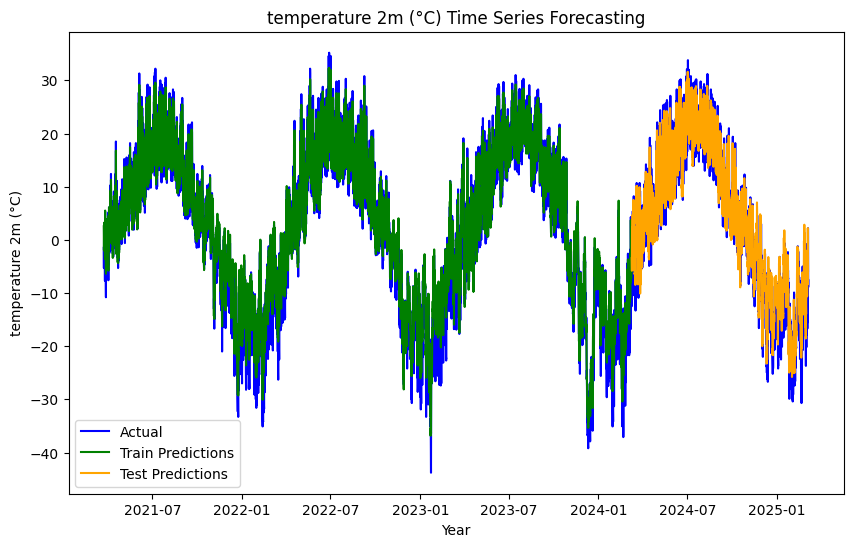

In [75]:
# Make predictions
train_predictions = model_lstm_50.predict(X_train)
test_predictions = model_lstm_50.predict(X_test)

# Plot predictions
plt.figure(figsize=(10, 6))

# Plot actual data
plt.plot(df.index[seq_length:], df['temperature_2m (°C)'][seq_length:], label='Actual', color='blue')

# Plot training predictions
plt.plot(df.index[seq_length:seq_length+len(train_predictions)], train_predictions, label='Train Predictions',color='green')

# Plot testing predictions
test_pred_index = range(seq_length+len(train_predictions), seq_length+len(train_predictions)+len(test_predictions))
plt.plot(df.index[test_pred_index], test_predictions, label='Test Predictions',color='orange')

plt.title('temperature 2m (°C) Time Series Forecasting')
plt.xlabel('Year')
plt.ylabel('temperature 2m (°C)')
plt.legend()
plt.show()

In [ ]:
import plotly.graph_objects as go

fig = go.Figure()

train_predictions = model_lstm_50.predict(X_train)
test_predictions = model_lstm_50.predict(X_test)

fig.add_trace(go.Scatter(x=df.index[seq_length:], 
                        y=df['temperature_2m (°C)'][seq_length:],
                        legendgroup='Validation',
                        name='Validation',
                        line=dict(shape='spline', smoothing=0.8,width=1),
                        # mode='markers+lines',
                        # marker=dict(color='red'),
                        hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                        )
            )

fig.add_trace(go.Scatter(x=df.index[seq_length:seq_length+len(train_predictions)], 
                        y=train_predictions.flatten(),
                        legendgroup='Train Predictions',
                        name='Train Predictions',
                        line=dict(shape='spline', smoothing=0.8, width=1),
                        mode='lines',
                        # mode='markers+lines',
                        # marker=dict(color='red'),
                        hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                        )
            )

test_pred_index = range(seq_length+len(train_predictions), seq_length+len(train_predictions)+len(test_predictions))

fig.add_trace(go.Scatter(x=df.index[test_pred_index], 
                        y=test_predictions.flatten(),
                        legendgroup='Test Predictions',
                        name='Test Predictions',
                        line=dict(shape='spline', smoothing=0.8, width=1),
                        mode='lines',
                        # mode='markers+lines',
                        # marker=dict(color='red'),
                        hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                        )
            )

fig.update_yaxes(title_text="<b>Показатели</b>")
fig.update_xaxes(title_text="<b>Date</b>")


fig.update_layout(
    height=550, 
    width=1000, 
    title_text="<b>Метрики обучения</b>", 
    legend=dict(
        font=dict(size=14),
        bgcolor='rgba(240, 240, 240, 0.5)',
        bordercolor='rgba(200, 200, 200, 1)',
        borderwidth=1,
    ),
    plot_bgcolor='rgba(210, 210, 210, 0.5)',
)

fig.show()

In [ ]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as py

# Create initial figure with daily grouping
df['group'] = df.index
df_grouped = df.groupby('group')['temperature_2m (°C)'].mean().reset_index()


fig = px.line(df_grouped, 
                x='group', 
                y='temperature_2m (°C)',
                line_shape='spline',
                title="<b>График температуры на высоте 2х метров</b>")

fig.update_traces(line=dict(width=2, smoothing=0.8))
fig.update_xaxes(range=[df['time'][0] - pd.Timedelta(weeks=2), df['time'].iloc[-1] + pd.Timedelta(weeks=2)])

# Add dropdown menu for grouping options
fig.update_layout(
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            buttons=list([
                dict(
                    args=[{'x': [df.groupby(df['time'])['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'])['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="All",
                    method="restyle"
                ),
                dict(
                    args=[{'x': [df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="Day",
                    method="restyle"
                ),
                dict(
                    args=[{'x': [df.groupby(df['time'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="Week",
                    method="restyle"
                ),
                dict(
                    args=[{'x': [df.groupby(df['time'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                    df.groupby(df['time'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']],
                            'type':'line'}],
                    label="Month",
                    method="restyle"
                )
            ]),
                font=dict(size=14),
                x=0.025, xanchor="left", y=1.15, yanchor="top" # positioning of the dropdown
        ),
    ],
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ]),
            font=dict(size=14),
            x=0.06, xanchor="left", y=1.1, yanchor="top" # positioning of the dropdown
        ),
    rangeslider=dict(visible=True),
    type="date",
    ),
height=550, 
width=3000, 
# title_text="<b>График температуры а высоте 2х метров</b>",
legend=dict(
    font=dict(size=14),
    bgcolor='rgba(240, 240, 240, 0.5)',
    bordercolor='rgba(200, 200, 200, 1)',
    borderwidth=1,
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
),
plot_bgcolor='rgba(210, 210, 210, 0.5)',
xaxis_title="<b>Время</b>",
yaxis_title="<b>Температура</b>"
# paper_bgcolor='rgba(250, 250, 250, 1)'
)

py.plot(fig, filename=r'temperature_2m_Time.html')
fig.show()

In [108]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as py

data = {
    'Validation': {'x': df.index[seq_length:], 'y': df['temperature_2m (°C)'][seq_length:]},
    'Train Predictions': {'x': df.index[seq_length:seq_length+len(train_predictions)], 'y': train_predictions.flatten()},
    'Test Predictions': {'x': df.index[range(seq_length+len(train_predictions), seq_length+len(train_predictions)+len(test_predictions))], 'y': test_predictions.flatten()}
}

# Создаем график с помощью Plotly Express
fig = px.line(pd.DataFrame(data['Validation']), x='x', y='y', title="<b>Метрики обучения</b>")


# Добавляем остальные линии из словаря data
for name, values in data.items():
    if name != 'Validation':
        fig.add_trace(go.Scatter(x=values['x'], y=values['y'], name=name, mode='lines'))


# Настройка внешнего вида графика (аналогично вашему коду с go.Figure)
# fig.update_traces(line=dict(shape='spline', smoothing=0.8, width=2))
fig.update_xaxes(
    title_text="<b>Date</b>",
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ]),
        font=dict(size=14),
        x=0.06, xanchor="left", y=1.1, yanchor="top"
    ),
    rangeslider=dict(visible=True),
    type="date"
)


fig.update_yaxes(title_text="<b>Показатели</b>")


fig.update_layout(
    height=550,
    width=1000,
    legend=dict(
        font=dict(size=14),
        bgcolor='rgba(240, 240, 240, 0.5)',
        bordercolor='rgba(200, 200, 200, 1)',
        borderwidth=1,
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    plot_bgcolor='rgba(210, 210, 210, 0.5)',
    xaxis_title="<b>Время</b>",
    yaxis_title="<b>Температура</b>"
)


# Добавляем dropdown для выбора группировки
fig.update_layout(
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            x=0.025, xanchor="left", y=1.15, yanchor="top",
            font=dict(size=14),
            buttons=list([
                dict(label="All", method="restyle",
                        args=[
                            {"x": 
                                data['Validation']['x'], 
                                "y":data['Validation']['y']
                            }
                        ]
                    ),
                dict(label="Day", method="restyle",
                        args=[
                            {"x": df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                "y": df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']
                                }
                            ]
                    ),
                dict(label="Week", method="restyle",
                        args=[
                            {"x": df.groupby(df['time'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                "y": df.groupby(df['time'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']
                            }
                        ]
                    ),
                dict(label="Month", method="restyle",
                        args=[
                            {"x": df.groupby(df['time'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['time'],
                                "y": df.groupby(df['time'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']
                            }
                        ]
                    ),
            ])
        )
    ]
)

fig.show()

KeyError: 'time'

In [110]:
test_predictions

array([[-3.440269 ],
       [-4.420671 ],
       [-4.8232145],
       ...,
       [-4.847381 ],
       [-5.8143835],
       [-5.8474517]], dtype=float32)

In [128]:
c = np.concatenate((train_predictions, test_predictions), axis=0) 

In [129]:
c.flatten()

array([ 2.5545566,  2.2712917,  1.2888665, ..., -4.847381 , -5.8143835,
       -5.8474517], dtype=float32)

In [140]:
df.index[seq_length+len(train_predictions)+len(test_predictions)]

Timestamp('2025-03-05 12:00:00')

In [137]:
seq_length+len(train_predictions)+len(test_predictions)

34716

In [141]:
df_grouped_tr2.info

<bound method DataFrame.info of                     group  pred
0     2021-03-23 00:00:00   NaN
1     2021-03-23 01:00:00   NaN
2     2021-03-23 02:00:00   NaN
3     2021-03-23 03:00:00   NaN
4     2021-03-23 04:00:00   NaN
...                   ...   ...
34651 2025-03-05 19:00:00   NaN
34652 2025-03-05 20:00:00   NaN
34653 2025-03-05 21:00:00   NaN
34654 2025-03-05 22:00:00   NaN
34655 2025-03-05 23:00:00   NaN

[34656 rows x 2 columns]>

In [142]:
df_grouped.info

<bound method DataFrame.info of                     group  temperature_2m (°C)
0     2021-03-23 00:00:00                 -2.6
1     2021-03-23 01:00:00                 -1.0
2     2021-03-23 02:00:00                  0.2
3     2021-03-23 03:00:00                  1.3
4     2021-03-23 04:00:00                  1.7
...                   ...                  ...
34651 2025-03-05 19:00:00                 -8.6
34652 2025-03-05 20:00:00                 -8.5
34653 2025-03-05 21:00:00                 -8.8
34654 2025-03-05 22:00:00                 -8.2
34655 2025-03-05 23:00:00                 -7.6

[34656 rows x 2 columns]>

In [143]:
df['group'].unique()

<DatetimeArray>
['2021-03-23 00:00:00', '2021-03-23 01:00:00', '2021-03-23 02:00:00',
 '2021-03-23 03:00:00', '2021-03-23 04:00:00', '2021-03-23 05:00:00',
 '2021-03-23 06:00:00', '2021-03-23 07:00:00', '2021-03-23 08:00:00',
 '2021-03-23 09:00:00',
 ...
 '2025-03-05 14:00:00', '2025-03-05 15:00:00', '2025-03-05 16:00:00',
 '2025-03-05 17:00:00', '2025-03-05 18:00:00', '2025-03-05 19:00:00',
 '2025-03-05 20:00:00', '2025-03-05 21:00:00', '2025-03-05 22:00:00',
 '2025-03-05 23:00:00']
Length: 34656, dtype: datetime64[ns]

In [ ]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as py
from plotly.subplots import make_subplots

df['group'] = df.index
df['pred'] = np.nan
df['pred'][seq_length:seq_length+len(train_predictions)+len(test_predictions)] = c.flatten()
df_grouped = df.groupby('group')['temperature_2m (°C)'].mean().reset_index()
df_grouped_tr2 = df.groupby('group')['pred'].mean().reset_index()

# 2. Create the Subplots
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_grouped['group'][seq_length:], 
                    y=df_grouped['temperature_2m (°C)'][seq_length:],
                    mode='lines',
                    name='Температура',
                    hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                    line=dict(width=1.5, smoothing=0.8),
                    )
            )

fig.add_trace(go.Scatter(x=df_grouped_tr2['group'][seq_length:],
                    y=df_grouped_tr2['pred'][seq_length:seq_length+len(train_predictions)],
                    # mode='lines',
                    name='Скорость ветра',
                    hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                    line=dict(width=1.5, smoothing=0.8)
                    )
            )

test_pred_index = range(seq_length+len(train_predictions), seq_length+len(train_predictions)+len(test_predictions))

fig.add_trace(go.Scatter(x=df_grouped_tr2['group'][],
                    y=df_grouped_tr2['pred'][test_pred_index],
                    # mode='lines',
                    name='Скорость ветра',
                    hovertemplate='time: %{x}<br>Value: %{y}<br>Name: %{fullData.name}',
                    line=dict(width=1.5, smoothing=0.8)
                    )
            )

fig.update_layout(
    height=900,
    width=3000,
    title_text="<b>Графики зависимости данных от времени</b>",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ]),
            font=dict(size=14),
            x=0.035, xanchor="left", y=1.05, yanchor="top"
        ),
    # rangeslider=dict(visible=True),
    type="date",
    ),
    yaxis=dict(title="<b>Температура (°C)</b>"), 
    # xaxis3=dict(
    #     rangeslider=dict(visible=True),
    #     type="date",
    # ),
    # xaxis2=dict(
    #     rangeslider=dict(visible=True),
    #     type="date",
    # ),
    # yaxis_title="<b>Температура</b>"
)

fig.update_layout(
    # updatemenus=[
    #     dict(
    #         buttons=list([
    #             dict(
    #                 args=[{"y":[df_grouped['temperature_2m (°C)'], df_grouped_tr2['wind_direction_10m (°)'], df_grouped_tr3['pressure_msl (hPa)'],],
    #                         "x":[df_grouped['group'], df_grouped_tr2['group'], df_grouped_tr3['group']]}],
    #                 label="All",
    #                 method="restyle"
    #             ),
    #             dict(
    #                 args=[
    #                     {"y":[df_grouped.groupby(df_grouped['group'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)'],
    #                             df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('D').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['wind_direction_10m (°)'],
    #                             df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('D').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['pressure_msl (hPa)']
    #                         ],

    #                     "x":[df_grouped.groupby(df_grouped['group'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
    #                             df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('D').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['group'],
    #                             df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('D').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['group'],
    #                         ]
    #                     }
    #                 ],
    #                 label="Day",
    #                 method="restyle"
    #             ),
    #             dict(
    #                 args=[
    #                     {"y":[df_grouped.groupby(df_grouped['group'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)'],
    #                                 df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('W').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['wind_direction_10m (°)'],
    #                                 df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('W').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['pressure_msl (hPa)'],
    #                             ],

    #                     "x":[df_grouped.groupby(df_grouped['group'].dt.to_period('W').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
    #                             df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('W').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['group'],
    #                             df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('W').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['group'],
    #                         ]
    #                     }
    #                 ],
    #                 label="Week",
    #                 method="restyle"
    #             ), 
    #             dict(
    #                 args=[
    #                     {"y":[df_grouped.groupby(df_grouped['group'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)'],
    #                             df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('M').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['wind_direction_10m (°)'],
    #                             df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('M').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['pressure_msl (hPa)'],
    #                         ],

    #                     "x":[df_grouped.groupby(df_grouped['group'].dt.to_period('M').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
    #                             df_grouped_tr2.groupby(df_grouped_tr2['group'].dt.to_period('M').dt.start_time)['wind_direction_10m (°)'].mean().reset_index()['group'],
    #                             df_grouped_tr3.groupby(df_grouped_tr3['group'].dt.to_period('M').dt.start_time)['pressure_msl (hPa)'].mean().reset_index()['group'],
    #                         ]
    #                     }
    #                 ],
    #                 label="Month",
    #                 method="restyle"
    #             ),
    #         ]),
    #         font=dict(size=14),
    #         x=0.0, xanchor="left", y=1.06, yanchor="top"
    #     )
    # ],
    xaxis_rangeslider_visible = True,
    xaxis_rangeslider_thickness = 0.06,
    legend=dict(
        font=dict(size=14),
        bgcolor='rgba(240, 240, 240, 0.5)',
        bordercolor='rgba(200, 200, 200, 1)',
        borderwidth=1,
    ),
    plot_bgcolor='rgba(210, 210, 210, 0.5)',
)
# fig.update_traces(hovertemplate='time: %{x}<br>Value: %{y}')

# fig.write_image(r"temperature_2m_pressure_Time.svg")
fig.show()
# py.plot(fig, filename=r'temperature_2m_pressure_Time.html')

# [df.groupby(df['group'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['group'],
#                                     df.groupby(df['time'].dt.to_period('D').dt.start_time)['temperature_2m (°C)'].mean().reset_index()['temperature_2m (°C)']]

C:\Windows\Temp\ipykernel_23308\3367898594.py:9: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


C:\Windows\Temp\ipykernel_23308\3367898594.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See 

KeyError: '[34656, 34657, 34658, 34659, 34660, 34661, 34662, 34663, 34664, 34665, 34666, 34667, 34668, 34669, 34670, 34671, 34672, 34673, 34674, 34675, 34676, 34677, 34678, 34679, 34680, 34681, 34682, 34683, 34684, 34685, 34686, 34687, 34688, 34689, 34690, 34691, 34692, 34693, 34694, 34695, 34696, 34697, 34698, 34699, 34700, 34701, 34702, 34703, 34704, 34705, 34706, 34707, 34708, 34709, 34710, 34711, 34712, 34713, 34714, 34715] not in index'

In [ ]:
fig = px.line(x=df.index[seq_length:seq_length+len(train_predictions)], y=train_predictions.flatten())

array([[ 2.55455661],
       [ 2.27129173],
       [ 1.28886652],
       ...,
       [-5.88413286],
       [-5.36152267],
       [-4.546556  ]])